Assignment 1:

Name: Sawyer Byrd

UID: 117786866

# Part A: Hybrid Image

## Overview

A hybrid image is the sum of a *low-pass filtered* version of the one image and a *high-pass filtered* version of a second image. There is a free parameter, which can be tuned for each image pair, which controls how much high frequency to remove from the first image and how much low frequency to leave in the second image. This is called the “cutoff-frequency”.

## Data

In [5]:
import os
print(os.listdir('content/data'))

['dog.bmp', 'motorcycle.bmp', 'makeup_before.jpg', 'einstein.bmp', 'makeup_after.jpg', 'Afghan_girl_after.jpg', 'plane.bmp', 'marilyn.bmp', 'bicycle.bmp', 'cat.bmp', 'submarine.bmp', 'bird.bmp', 'fish.bmp', 'Afghan_girl_before.jpg']


### Read and show images 
Let's start with some helper functions.

In [9]:
# Import necessary packages here
import numpy as np
from PIL import Image

# Helper Functions
def read_image_pil(image_path):
    """
    :param image_path: path to the image
    :return: representation of the image
    """
    # TODO: YOUR CODE HERE (10 pts)
    image = Image.open(image_path)

    return image


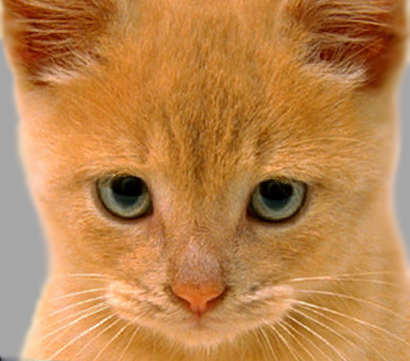

In [11]:
# Check if you can read and show an image. You are free to change path.
image_path = 'content/data/cat.bmp'
image_pil = read_image_pil(image_path)
# PIL image can be directly shown by just calling it.
image_pil

We can do conversions between PIL image format and numpy array.

In [12]:
print(image_pil)  # show the data type of an PIL image
image_np = np.array(image_pil) # PIL image -> numpy array
print('Image shape: ', image_np.shape) # show the shape
print('Data type: ', image_np.dtype) # show the data type
print(image_np) # show exact pixel values
image_pil_new = Image.fromarray(image_np) # numpy array -> PIL image
print(image_pil_new)

<PIL.BmpImagePlugin.BmpImageFile image mode=RGB size=410x361 at 0x7FC66C183940>
Image shape:  (361, 410, 3)
Data type:  uint8
[[[207 171 121]
  [197 152  96]
  [185 132  67]
  ...
  [208 174 144]
  [216 187 163]
  [218 193 174]]

 [[216 181 136]
  [204 162 109]
  [191 137  79]
  ...
  [208 174 144]
  [215 188 162]
  [219 194 172]]

 [[224 189 148]
  [212 168 120]
  [195 144  91]
  ...
  [208 175 145]
  [216 188 162]
  [221 195 171]]

 ...

 [[ 49  50  53]
  [ 97  98 101]
  [118 119 122]
  ...
  [207 150  88]
  [208 149  87]
  [209 153  89]]

 [[ 39  40  43]
  [ 81  83  85]
  [ 99 103 107]
  ...
  [204 146  85]
  [205 149  87]
  [210 154  92]]

 [[ 36  39  41]
  [ 72  75  76]
  [ 91  94  98]
  ...
  [205 150  87]
  [207 154  91]
  [212 159  96]]]
<PIL.Image.Image image mode=RGB size=410x361 at 0x7FC663AE8100>


There are also other ways to show an image. For example, you can also use `matplotlib.pyplot`.

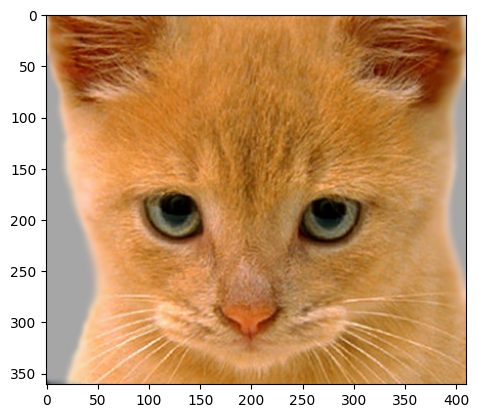

In [13]:
import matplotlib.pyplot as plt

plt.imshow(image_np)
plt.show()

## Implementation of Hybrid Image
Now let's start to implement hybrid image. We will start again with some helper functions.

### Data type 
In practice, we need to convert the data type into `float` so that we can apply mathematical operations. We first write `read_image` function below.

In [70]:
# Helper Functions
def read_image(image_path):
    """
    :param image_path: path to the image
    :return: floating representation of the image. Use np.float64.
    """
    # TODO: YOUR CODE HERE (10 pts)
    
    image = np.float64(np.array(Image.open(image_path))) / 255.0

    return image

def vis_hybrid_image(hybrid_image):
  """
  NO NEED TO CHANGE THIS FUNCTION.
  Visualize a hybrid image by progressively downsampling the image and
  concatenating all of the images together.
  :param hybrid_image:
  :return:
  """
  scales = 5
  scale_factor = 0.5
  padding = 5
  original_height = hybrid_image.shape[0]
  num_colors = hybrid_image.shape[2] # counting how many color channels the input has
  output = hybrid_image
  cur_image = hybrid_image

  for i in range(2, scales):
      # add padding
      output = np.concatenate((output, np.ones((original_height, padding, num_colors), dtype=int)), axis=1)
      # dowsample image;
      width = int(cur_image.shape[1] * scale_factor)
      height = int(cur_image.shape[0] * scale_factor)
      dim = (width, height)
      cur_image = cv2.resize(cur_image, dim, interpolation = cv2.INTER_LINEAR)
      # pad the top and append to the output
      tmp = np.concatenate((np.ones((original_height-cur_image.shape[0], cur_image.shape[1], num_colors)), cur_image), axis=0)
      output = np.concatenate((output, tmp), axis=1)

  output = (output * 255).astype(np.uint8)
  return output

Let's check if it is right. The value range should be in [0.0, 1.0].

In [71]:
image_path = 'content/data/cat.bmp'
img = read_image(image_path)
print(img.shape)
print(img.dtype)
print('value range: [{}, {}]'.format(img.min(), img.max()))

(361, 410, 3)
float64
value range: [0.0, 1.0]


### 2D Gaussian filters
We will implement a 2D Gaussian filter function in `gaussian_2D_filter`.

A 2D Gaussian filter $G(x,y)$ is a matrix/tensor filled with values, represented as:
$$G(x,y)= \frac{1}{2 \pi \sigma^2} \exp^{-\frac{x^2 + y^2}{2 \sigma^2}} \,,$$
where $x$ and  $y$  denote the distances from the origin along the horizontal and vertical axes, respectively, and  $\sigma$  represents the standard deviation, which controls the extent of the blur or "cut-off frequency".



In [83]:
import cv2
from scipy.signal import convolve2d

def gaussian_2D_filter(size, sigma):
    """
    :param size: tuple (width, height) that decides the filter size
    :param sigma: standard deviation, hyperparameter to control the variance of the filter
    :return: 2D gaussian filter with the desired size, and variance scaled by cutoff_frequency
    Hint: make sure the filter sums up to one
    Do NOT use scipy's API to get the filter. Please just use numpy to implement the Gaussian equation.
    """
    # TODO: YOUR CODE HERE (5 pts)
    # Step 1: Make a mesh grid using `np.meshgrid`. (Why?)
    
    x_range = np.linspace(-size[0] / 2, size[0] / 2, size[0])
    y_range = np.linspace(-size[1] / 2, size[1] / 2, size[1])
    
    mesh_x, mesh_y = np.meshgrid(x_range, y_range)

    # Step 2: Compute Gaussian function with `np.exp` and the mesh grid.
    
    frac = (1 / (2.0 * np.pi * (sigma ** 2.0)))
    z = (mesh_x ** 2.0 + mesh_y ** 2.0) / (2.0 * (sigma ** 2.0))
    filter = frac * np.exp(-z)
    
    # Step 3: Normalize so that sum equals 1

    filter = filter / filter.sum()

    return filter

def imgfilter(image, filter, conv_mode='same', boundary='symm'):
    """
    Apply a 2D filter to an image using convolution. Supports both grayscale and RGB images.

    :param image: input image (grayscale or RGB) to apply the filter on
    :param filter: the filter to apply on the image
    :param conv_mode: 'same' or 'valid'
    :param boundary: 'symm', 'reflect', or 'wrap'
    :return: apply the filter by convolving
    Do NOT use for loops. See how to convolve with scipy.signal.convolve2d.
    """
    # TODO: YOUR CODE HERE (5 pts)

    # Step 1: check if it is a grayscale image or a RGB image.
    
    if len(image.shape) == 2:
        output = convolve2d(image, filter, mode=conv_mode, boundary=boundary)
        return output

    # Step 2: apply the filter to it
    
    output = np.zeros(image.shape)
    for i in range(image.shape[2]):
        output[:, :, i] = convolve2d(image[:, :, i], filter, mode=conv_mode, boundary=boundary)
    


    return output


(25, 25)
Sum of the filter should be 1:  0.9999999999999999


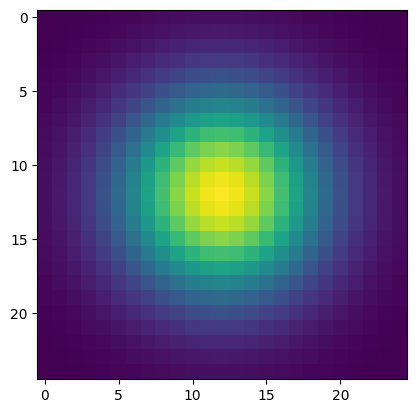

In [84]:
# Sanity check
filter_example = gaussian_2D_filter((25, 25), sigma=5.0)
print(filter_example.shape)
print('Sum of the filter should be 1: ', filter_example.sum())

# Visualize it
plt.imshow(filter_example)
plt.show()

### Visualize FFT
After applying a Gaussian filter, high-frequency component is reduced. A way to check one's frequency domain is to use Fast Fourier Transform (FFT). Let's now implement `log_mag_FFT` function below.

In [85]:
def log_mag_FFT(image):
    """
    :param image: float matrix representation of the image
    :return: log of the magnitude of the FFT of the image
    HINT: You may use np.log(np.abs(np.fft.fftshift(np.fft.fft2(image)))) to achieve it.
    NOTE1: numpy fft2 would require you to convert the image to grayscale for it to work properly.
    NOTE2: To make grayscale, you may use either `grey = R*0.3 + G*0.59 + B*0.11` or `cv2.cvtColor`.
    """
    # TODO: YOUR CODE HERE

    # Step 1: convert an image to grayscale if needed.

    if len(image.shape) != 2:
        image = np.float64(cv2.cvtColor(np.float32(image), cv2.COLOR_RGB2GRAY))

    # Step 2: compute log magnitute.
    
    output = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image))))

    return output

Let's see how we have done so far. Below we read an image, create and apply a Gaussian filter to it, and visualize the log magnitute of the FFT.

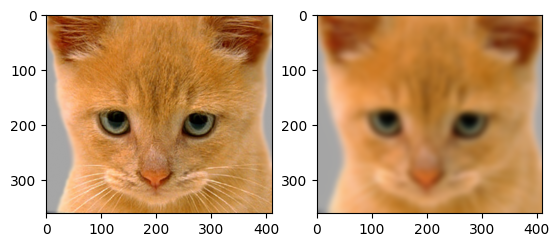

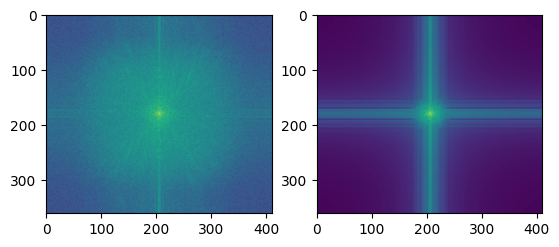

In [86]:
# Read an image
img_path = 'content/data/cat.bmp'
img = read_image(img_path)

# make a Gaussian filter. Feel free to modify parameters.
filter_size = 25
sigma = 5.0
gaussian_filter = gaussian_2D_filter((filter_size, filter_size), sigma)

# apply the filter
img_low_freq = imgfilter(img, gaussian_filter)

# visualize images (before and after, side by side)
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(img_low_freq)
plt.show()

# visualize the FFT (before and after, side by side)
plt.subplot(1, 2, 1)
plt.imshow(log_mag_FFT(img))
plt.subplot(1, 2, 2)
plt.imshow(log_mag_FFT(img_low_freq))
plt.show()


### Hybrid image
It's time to officially implement Hybrid Image.

Let's wrap up all the stuff in a single function `hybrid_image`.


In [108]:
from re import I
# Finish hybrid_image.
def hybrid_image(image1, image2, sigma_low_freq, sigma_high_freq, if_visual=False):
    """
    :param image1: image of type float64
    :param image2: image of type float64
    :param sigma_low_freq: Standard deviation for the low-pass filter (image1)
    :param sigma_high_freq: Standard deviation for the high-pass filter (image2)
    :return: Hybrid image combining low-frequency and high-frequency content
    """

    # Determine filter size based on sigma (typically 6*sigma covers most of the Gaussian)
    filter_size_low = (int(6 * sigma_low_freq) | 1, int(6 * sigma_low_freq) | 1)
    filter_size_high = (int(6 * sigma_high_freq) | 1, int(6 * sigma_high_freq) | 1)

    ###### TODO START #######
    # TODO: Finish hybrid image.
    # Step 1: Create Gaussian filters
    low_pass_filter = gaussian_2D_filter(filter_size_low, sigma_low_freq)
    high_pass_filter = gaussian_2D_filter(filter_size_high, sigma_high_freq)

    # Step 2: Apply low-pass filter to image1
    low_frequencies = imgfilter(image1, low_pass_filter)

    # Step 3: Apply low-pass filter to image2 and subtract from original to get high frequencies
    low_from_image2 = imgfilter(image2, high_pass_filter)
    high_frequencies = image2 - low_from_image2

    # Step 4: Combine the two components
    hybrid = low_frequencies + high_frequencies
    output = hybrid

    # Step 5: clip output value range if needed. See np.clip().
    output = np.clip(hybrid, 0, 1)

    ###### TODO END ######

    if if_visual:
      # Visualization code. NO NEED TO CHANGE.
      # visualize two input images, sigma_low_freq, sigma_high_freq, and the hybrid image.
      fig, axs = plt.subplots(2, 5, figsize=(20, 10))
      axs[0, 0].imshow(image1)
      axs[0, 1].imshow(low_frequencies)
      axs[0, 2].imshow(image2)
      axs[0, 3].imshow(high_frequencies + 0.5)
      axs[0, 4].imshow(output)

      # visualize log magnitude of Fourier Transform of the above.
      axs[1, 0].imshow(log_mag_FFT(image1), vmin=0, vmax=10)
      axs[1, 1].imshow(log_mag_FFT(low_frequencies), vmin=0, vmax=10)
      axs[1, 2].imshow(log_mag_FFT(image2), vmin=0, vmax=10)
      axs[1, 3].imshow(log_mag_FFT(high_frequencies), vmin=0, vmax=10)
      axs[1, 4].imshow(log_mag_FFT(output), vmin=0, vmax=10)

      axs[0, 0].set_title('Image 1')
      axs[0, 1].set_title('Low-freq of Image 1')
      axs[0, 2].set_title('Image 2')
      axs[0, 3].set_title('High-freq of Image 2')
      axs[0, 4].set_title('Hybrid image')
      axs[1, 0].set_title('FFT of Image 1')
      axs[1, 1].set_title('FFT of Low-freq Image 1')
      axs[1, 2].set_title('FFT of Image 2')
      axs[1, 3].set_title('FFT of High-freq Image 2')
      axs[1, 4].set_title('FFT of Hybrid image')
      #plt.subplots_adjust(hspace=0)
      fig.tight_layout()
      plt.show()

      # visualize hybrid_image_scale using helper function vis_hybrid_image.
      fig, ax = plt.subplots(figsize=(20, 10))
      ax.imshow(vis_hybrid_image(output))
      plt.show()



    return output  # Ensure valid pixel range for floating point images (0-1)

Let's see if we are doing it right. You should see a hybrid image of a dog and a cat.

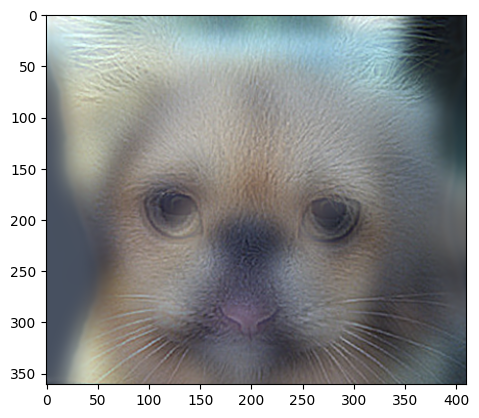

In [109]:
# read two images
image_path1 = 'content/data/dog.bmp'
image_path2 = 'content/data/cat.bmp'
image1 = read_image(image_path1)
image2 = read_image(image_path2)

# do hybrid image
hybrid_output = hybrid_image(image1, image2, sigma_low_freq=10, sigma_high_freq=2, if_visual=False)

# show output
plt.imshow(hybrid_output)
plt.show()

## Running different examples

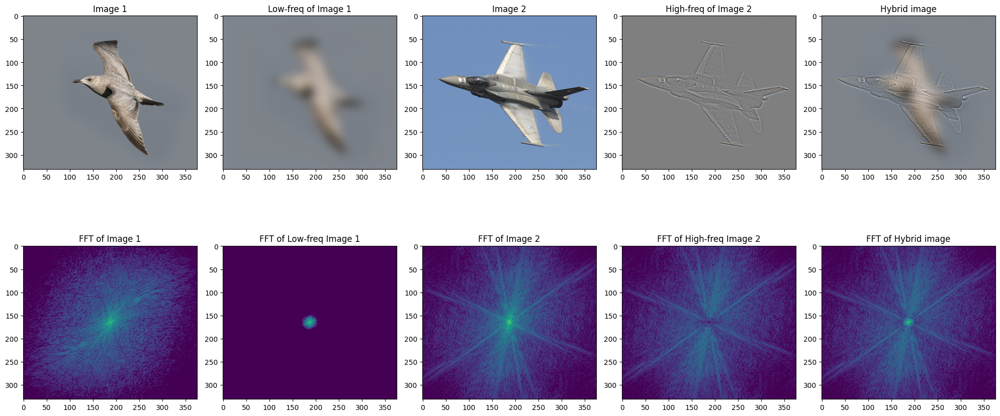

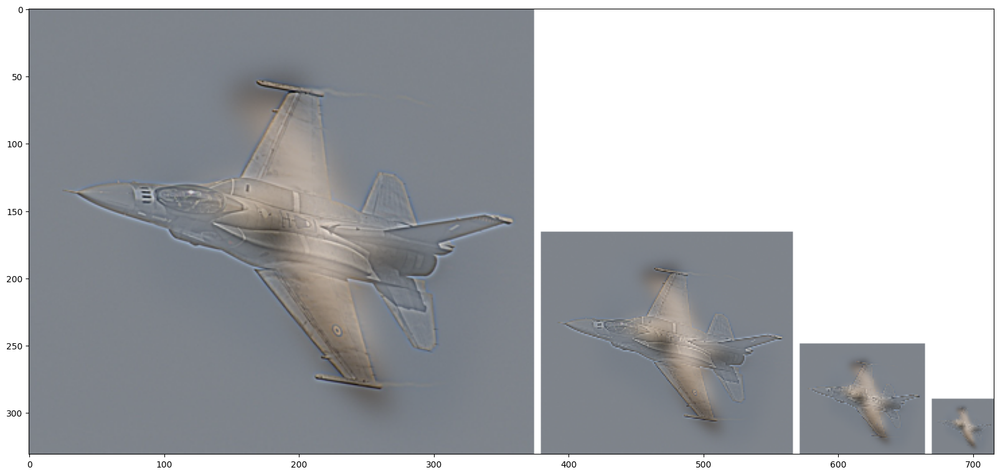

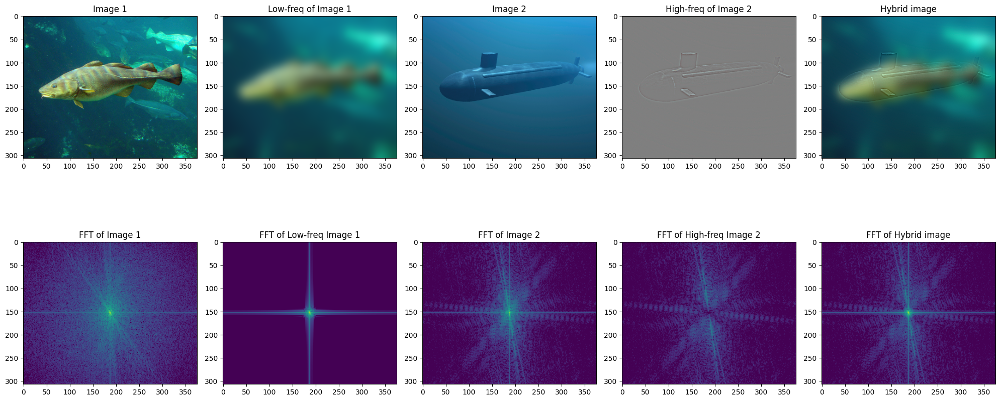

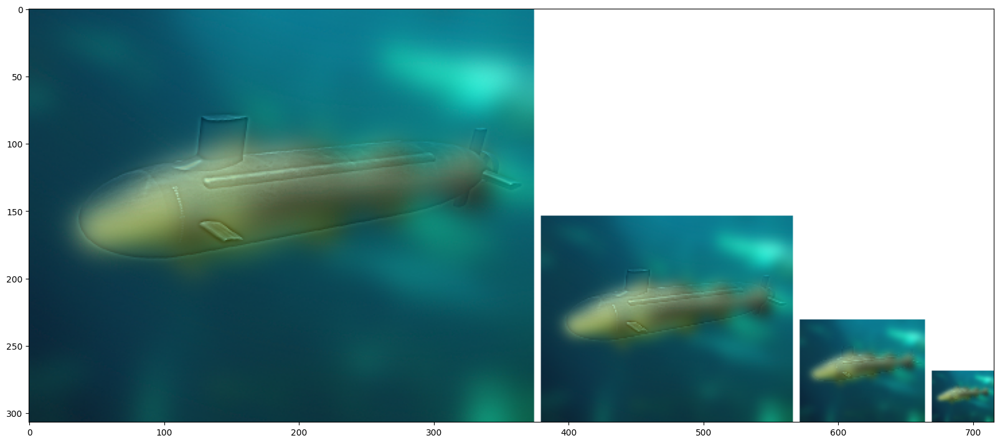

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09249371448394372..1.089748654260925].


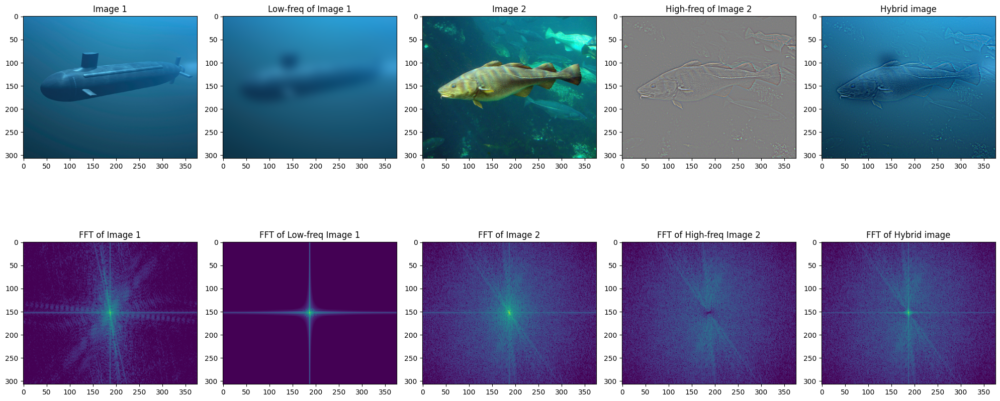

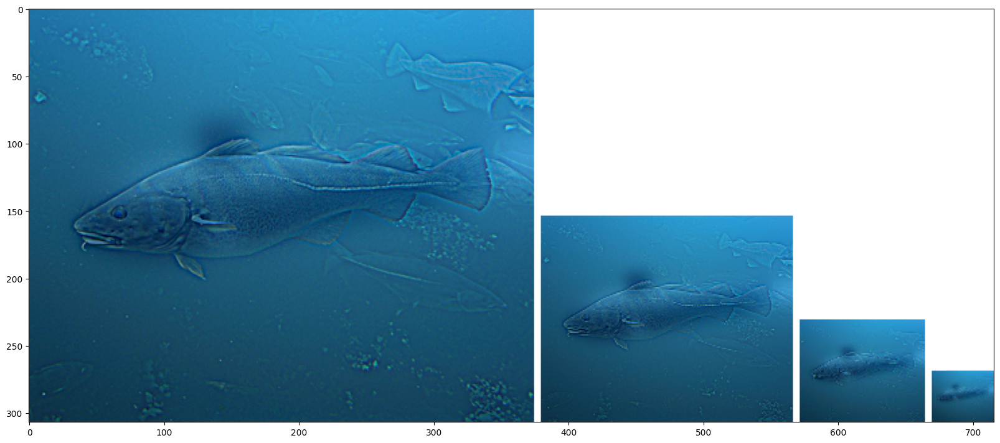

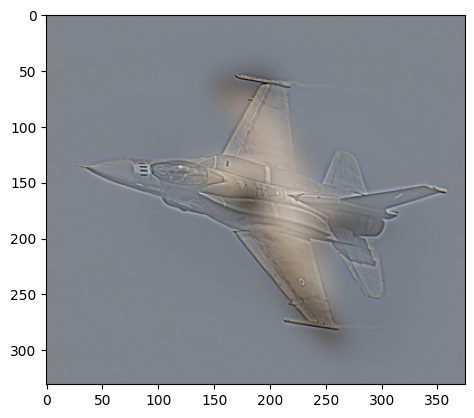

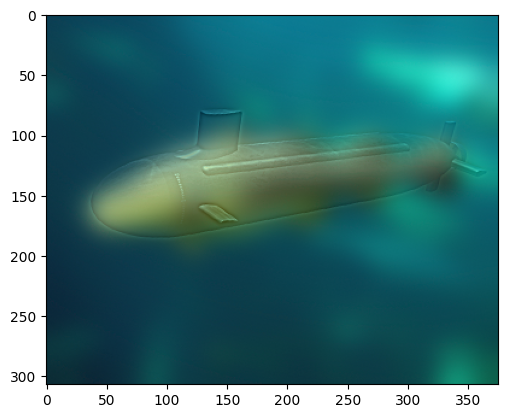

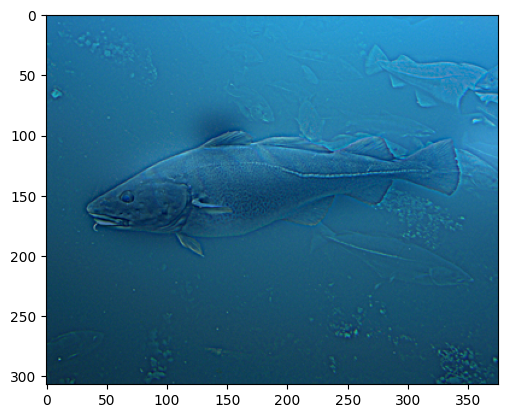

In [118]:
# read two images
image_path1 = 'content/data/plane.bmp'
image_path2 = 'content/data/bird.bmp'
image_path3 = 'content/data/fish.bmp'
image_path4 = 'content/data/submarine.bmp'

image1 = read_image(image_path1)
image2 = read_image(image_path2)
image3 = read_image(image_path3)
image4 = read_image(image_path4)

# do hybrid image
hybrid_output_1 = hybrid_image(image2, image1, sigma_low_freq=10, sigma_high_freq=2, if_visual=True)
hybrid_output_2 = hybrid_image(image3, image4, sigma_low_freq=10, sigma_high_freq=2, if_visual=True)
hybrid_output_3 = hybrid_image(image4, image3, sigma_low_freq=10, sigma_high_freq=2, if_visual=True)


# show output
plt.imshow(hybrid_output_1)
plt.show()
plt.imshow(hybrid_output_2)
plt.show()
plt.imshow(hybrid_output_3)
plt.show()

vis_hybrid_image shows the process of combining the two images into a hybrid. It prints the two images, their high or low frequencies, as well as a progressive downsampling. As the images are downsampled, you can see more and more of the low frequency image.

The FFTs of the low frequencies are colored only in the center (and sometimes protruding in a line vertically and horizontally). The FFTs of the high frequencies are colored everywhere except the center. This is effectivly a visualization of the low and high frequencies respectively.

hybrid_image effectivly applies a gaussian blur as the low frequency of image1. It then makes a gaussian blur of the second image and subtracts it from the original image to get a high frequency pass of the second image. It then takes these 2 and overlaps them, i.e. overlapping the low frequency of one image with the high frequency of the other image. You can see this by making a hybrid of the same 2 images but swapping the order when passing them into the function. I demonstrated this above in part 1 with the fish and submarine images

# Part B: Pyramid Image 

## Overview
Write code for a Gaussian and Laplacian pyramid of level N (use for loops). In each level, the resolution should be reduced by a factor of 2. Show the pyramids for your chosen image in your write-up. Here is an [example](https://drive.google.com/uc?id=17Y287EA-GJ2z0wtm_M7StIWsXyFeHvrz).

In [145]:
# Populate Helper Functions:

def pyramidsGL(image, num_levels, kernel_size=5, sigma=3.0):
  '''
  Creates Gaussian (G) and Laplacian (L) pyramids of level "num_levels" from image.
  G and L are list where G[i], L[i] stores the i-th level of Gaussian and Laplacian pyramid, respectively.
  NOTE: you may use cv2.GaussianBlur and cv2.resize in this function
  '''
  # YOUR CODE HERE (10 pts)

  # Step 1: Create two lists for G and L, respectively.
  
  G = []
  G.append(image)
  L = []

  # Step 2: Go over each level.

  for i in range(1, num_levels):
  
    # Step 2.1: At each level, compute Gaussian blur result first.
  
    blurred = cv2.GaussianBlur(G[i - 1], (kernel_size, kernel_size), sigma)

    # Step 2.2: Then downsample the blurred image by a factor of 2.
  
    downsampled = cv2.resize(blurred, None, fx=0.5, fy=0.5)

    # Step 2.3: Append downsampled result to G list.

    G.append(downsampled)

    # Step 2.4: Compute the Laplacian part by subtracting the upsampled version of the next Gaussian level
    
    upsampled = cv2.resize(downsampled, None, fx=2, fy=2)
    laplacian = G[i - 1] - upsampled

    # Step 2.5: Append it to L list.
    
    L.append(laplacian)

  # Step 3: Append the last Gaussian level to Laplacian pyramid as the base layer
  
  L.append(G[-1])

  return G, L

def reconstructLaplacianPyramid(L, smallest_g):
  '''Given a Laplacian Pyramid L, reconstruct an image img.
     smallest_g should be the smallest scale of the gaussian pyramid (i.e. G[-1])
     NOTE: you may use cv2.resize in this function
  '''
  assert L[-1].shape == smallest_g.shape, "the shape of L[-1] is {}, while smallest g is {}".format(L[-1].shape, smallest_g.shape)
  # YOUR CODE HERE. (5 pts)
  # Step 1: Start with the smallest Gaussian image.

  image = smallest_g
  
  # Step 2: Reverse iterate over Laplacian levels

  for i in range(len(L) - 2, -1, -1):
        # Step 2.1: Upsample the current image

        image = cv2.resize(image, None, fx=2, fy=2)
        
        # Step 2.2: Add the corresponding Laplacian
        
        image = image + L[i]

  return image

def displayPyramids(G, L):
  '''
  NO NEED TO CHANGE THIS FUNCTION.
  Role of this function is to display intensity and Fast Fourier Transform (FFT) images of pyramids.
  NOTE: You may re-use your helper function  "log_mag_FFT" to compute this.
  '''
  # make a 4xlen(G) grid for placing images.
  fig, axs = plt.subplots(4, len(G), figsize=(20, 10))

  for i, (g, l) in enumerate(zip(G, L)):
    axs[0, i].imshow(cv2.resize(g, None, fx=(2**i), fy=(2**i), interpolation=cv2.INTER_NEAREST))
    axs[1, i].imshow(cv2.resize(l + 0.5, None, fx=(2**i), fy=(2**i), interpolation=cv2.INTER_NEAREST) if i < len(L) - 1 else l)
    axs[2, i].imshow(log_mag_FFT(g), vmin=0, vmax=10)
    axs[3, i].imshow(log_mag_FFT(l), vmin=0, vmax=10)

    axs[0, i].set_title('G#{}'.format(i))
    axs[1, i].set_title('L#{}'.format(i))
    axs[2, i].set_title('FFT of G#{}'.format(i))
    axs[3, i].set_title('FFT of L#{}'.format(i))

    for j in range(4):
      disable_ticks(axs[j, i])

  plt.subplots_adjust(0,0,1,1)
  plt.show()

def disable_ticks(ax):
    ax.tick_params(left=False,
                  right=False,
                  labelleft=False ,
                  labelbottom=False,
                  bottom = False)

Let's first do a sanity check.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06335576725756442..1.1665425253471764].


(768, 1024, 3) (768, 1024, 3)
(384, 512, 3) (384, 512, 3)
(192, 256, 3) (192, 256, 3)
(96, 128, 3) (96, 128, 3)
(48, 64, 3) (48, 64, 3)


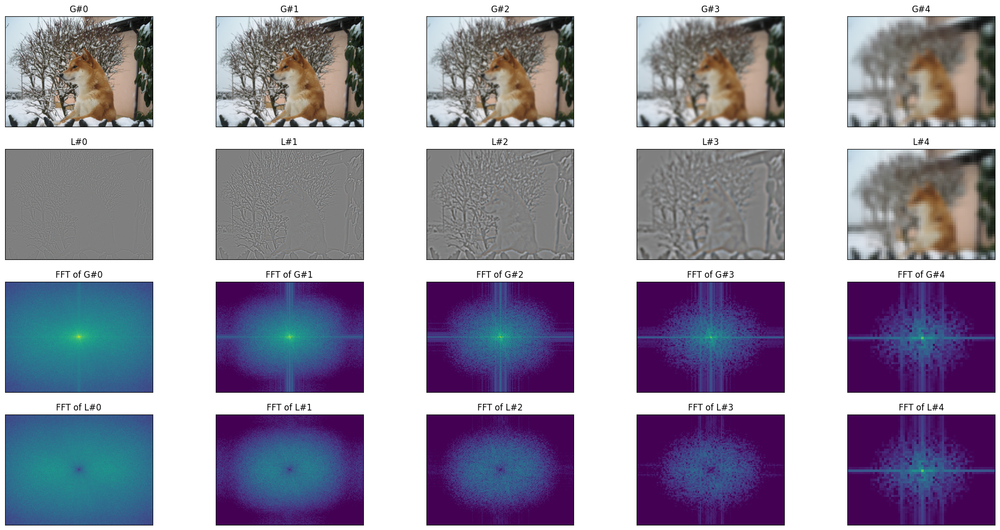

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.7755575615628914e-17..1.0].


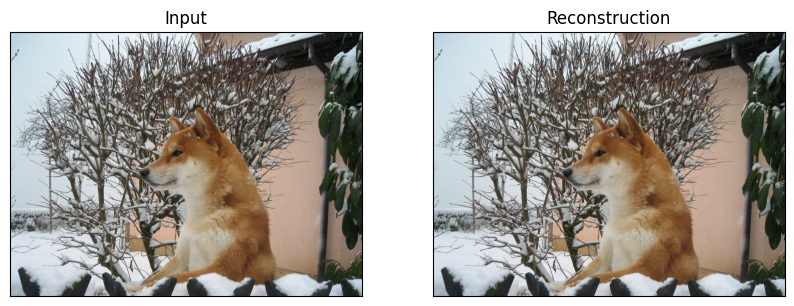

Reconstruction error: 3.141150743690514e-15


In [146]:
"""
Steps:
1. Load an image im.
2. Call function pyramidsGL with image and num_levels = 5
3. Call function displayPyramids with G, L
4. Call function reconstructLaplacianPyramid with the generated L and ONLY the smallest scale of G.
5. Display the original image and reconstructed image side by side.
6. Compute reconstruction error with L2 norm and print the error value.
"""

# TODO: YOUR CODE HERE
image_path = 'content/q2.jpg'
image = np.float64(Image.open(image_path)) / 255.

# Compute G and L pyramids
G, L = pyramidsGL(image, 5)

# Check if the number of levels is 5
assert len(G) == len(L) == 5, "G and L should have 5 levels"
# Check if each level has a same shape
for g, l in zip(G, L):
  print(g.shape, l.shape)
  assert g.shape == l.shape, "G and L should have the same shape"

# Display pyramids.
# You should be able to see a similar result: https://www.google.com/url?q=https%3A%2F%2Fdrive.google.com%2Fuc%3Fid%3D17Y287EA-GJ2z0wtm_M7StIWsXyFeHvrz
# For FFT, a example: https://drive.google.com/file/d/1JhK-T0m3YvFd0VKd__0EtPkSj__hZtV_/view?usp=sharing
displayPyramids(G, L)

# Inverse and reconstruct the Laplacian pyramid
recon = reconstructLaplacianPyramid(L, G[-1])
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image)
axs[1].imshow(recon)
disable_ticks(axs[0])
disable_ticks(axs[1])
axs[0].set_title('Input')
axs[1].set_title('Reconstruction')
plt.show()

# reconstruction
error_l2norm = np.sqrt(np.sum(np.square(recon - image)))
print('Reconstruction error: {}'.format(error_l2norm))
assert error_l2norm < 1e-12, 'Reconstruction error is too large'



At each level, we are blurring and then reducing the size by a factor of 2 (down sample) of the image. This new image gets added to the end of G, the Gaussian Pyramid. We then take the downsampled image, increase the size by a factor of 2 (upsample), and subtract it from the original image (the one that was blurred on this level). This new image gets added to L, The Laplacian Pyramid.

As we compute each level, the low frequency sample is stored in G (Gaussian) and the high frequency sample is stored in L (Laplacian). The low frequency sample is just the previous sample (starting from the original image) blurred. The high frequency sample is created by subtracting the gaussian blur pass from it's original image.

## An extra example

(480, 640) (480, 640)
(240, 320) (240, 320)
(120, 160) (120, 160)
(60, 80) (60, 80)
(30, 40) (30, 40)


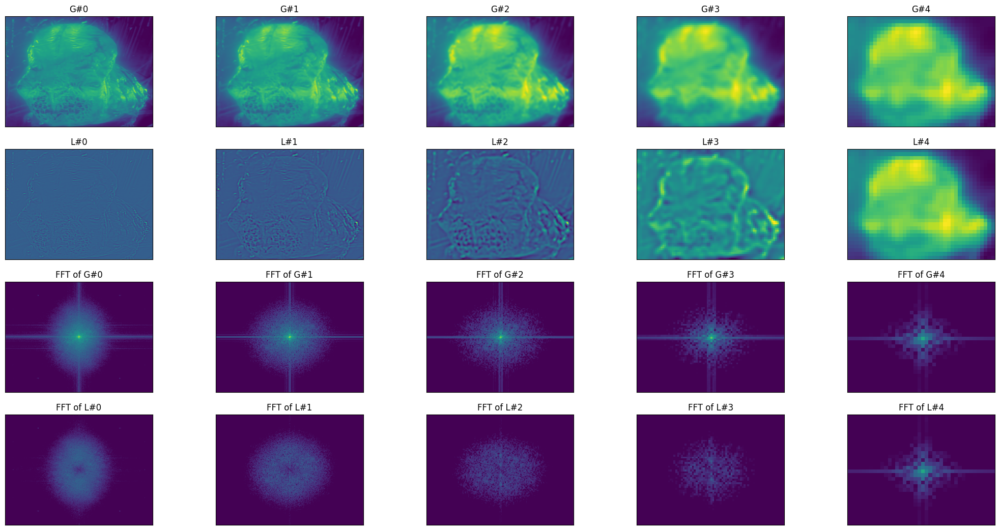

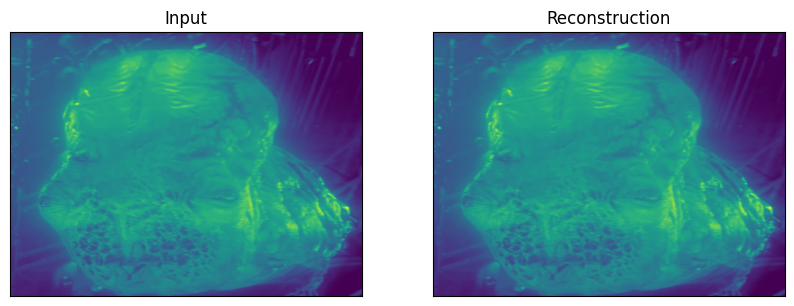

Reconstruction error: 4.320299403262292e-17


In [158]:
image_path = 'GuildNavWorking_3.png'
image = np.float64(Image.open(image_path)) / 255.
image = np.float64(cv2.cvtColor(np.float32(image), cv2.COLOR_RGB2GRAY))

# Compute G and L pyramids
G, L = pyramidsGL(image, 5)

# Check if the number of levels is 5
assert len(G) == len(L) == 5, "G and L should have 5 levels"
# Check if each level has a same shape
for g, l in zip(G, L):
  print(g.shape, l.shape)
  assert g.shape == l.shape, "G and L should have the same shape"

# Display pyramids.
displayPyramids(G, L)

# Inverse and reconstruct the Laplacian pyramid
recon = reconstructLaplacianPyramid(L, G[-1])
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image)
axs[1].imshow(recon)
disable_ticks(axs[0])
disable_ticks(axs[1])
axs[0].set_title('Input')
axs[1].set_title('Reconstruction')
plt.show()

# reconstruction
error_l2norm = np.sqrt(np.sum(np.square(recon - image)))
print('Reconstruction error: {}'.format(error_l2norm))
assert error_l2norm < 1e-12, 'Reconstruction error is too large'